## AMI data &  GIS

### GIS

Explore map

In [1]:
import HC

HC.explore_map()

In [1]:
from HC import Layers, Profile

layers = Layers()
profile = Profile()
v_data = profile.read_voltage_profile()
p_data = profile.read_load_profile()
layers.explore_map_ckt(profile)


Plot map

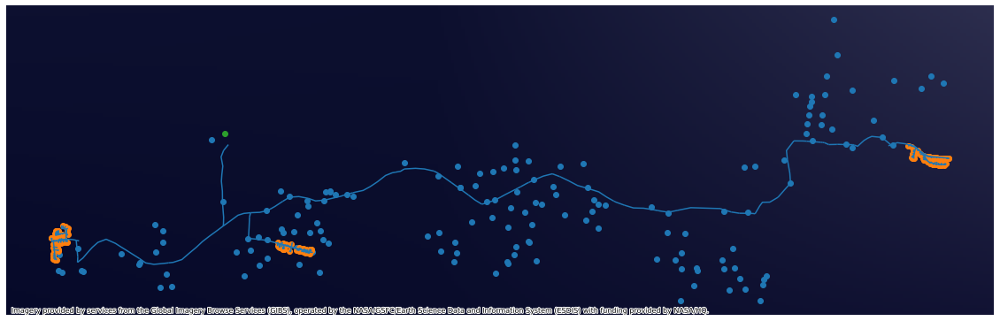

In [10]:
import matplotlib.pyplot as plt
import contextily as cx    # Background map to plots
import geopandas as gpd


services = "../ModelBased/MAR/GIS/Aco_aerea_Mario.shp"
loads = "../ModelBased/MAR/GIS/Cargas_Mario.shp"
MVlines = "../ModelBased/MAR/GIS/MT_aerea.shp"
LVlines = "../ModelBased/MAR/GIS/Lineas_BT_Mario.shp"
subEs = "../ModelBased/MAR/GIS/Subestacion.shp"
Tx = "../ModelBased/MAR/GIS/Transformadores.shp"

# Aco_aerea
gdf00 = gpd.read_file(services)
services_lines_gdf = gdf00.to_crs(epsg=5367)

# Cargas
gdf03 = gpd.read_file(loads)
LVloads_gdf = gdf03.to_crs(epsg=5367)

# MT_aerea
gdf05 = gpd.read_file(MVlines)
overH_MVlines_gdf = gdf05.to_crs(epsg=5367)

# Sec_aerea
gdf07 = gpd.read_file(LVlines)
overH_LVlines_gdf = gdf07.to_crs(epsg=5367)

# Subestacion
gdf09 = gpd.read_file(subEs)
subestation_gdf = gdf09.to_crs(epsg=5367)

# Transformadores
gdf10 = gpd.read_file(Tx)
transformers_gdf = gdf10.to_crs(epsg=5367)

fig, base = plt.subplots(figsize=(20, 20))
transformers_gdf.plot(ax=base)
LVloads_gdf.plot(ax=base)
overH_MVlines_gdf.plot(ax=base)
overH_LVlines_gdf.plot(ax=base)
services_lines_gdf.plot(ax=base)
subestation_gdf.plot(ax=base)
# base.set_title("MV/LV Network")
base.set_axis_off()
# Add a background map
cx.add_basemap(base,
               zoom = 5,
               source=cx.providers.NASAGIBS.ViirsEarthAtNight2012)

# plt.legend(["Transformers",
#             "Loads",
#             "MVlines",
#             "LVlines",
#             "Service Lines"])
plt.savefig("layers.pdf")
plt.show()
